## Capstone Solution Part 2 - EDA, Technical Analysis and Recommendations

In [1]:
##Load the libraries and the datasets created in Part 1

In [1]:
import pandas as pd
import numpy as np

In [2]:
import matplotlib.pyplot as plt
import seaborn as sns

In [25]:
import plotly.express as px
import plotly.figure_factory as ff
import plotly.graph_objects as go

In [3]:
avn_df = pd.read_csv('avn.csv')

In [4]:
fin_df = pd.read_csv('fin.csv')

In [5]:
pharma_df = pd.read_csv('phar.csv')

In [6]:
fb_df = pd.read_csv('fb.csv')

In [7]:
tech_df = pd.read_csv('tech.csv')

In [8]:
avn_df.head()

,Date,Close_aal,Close_algt,Close_alk,Close_dal,Close_ha,Close_luv
0,2010-10-01,9.29,43.230000,12.4475,12.01,5.96,12.94
1,2010-10-04,9.12,41.590000,12.1425,11.51,5.75,12.82
2,2010-10-05,9.23,42.099998,12.2150,11.83,5.85,13.02
3,2010-10-06,9.23,41.950001,12.1875,11.78,5.97,12.94
4,2010-10-07,9.24,41.700001,11.6250,11.77,6.15,12.88


In [9]:
avn_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2517 entries, 0 to 2516
Data columns (total 7 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Date        2517 non-null   object 
 1   Close_aal   2517 non-null   float64
 2   Close_algt  2517 non-null   float64
 3   Close_alk   2517 non-null   float64
 4   Close_dal   2517 non-null   float64
 5   Close_ha    2517 non-null   float64
 6   Close_luv   2517 non-null   float64
dtypes: float64(6), object(1)
memory usage: 137.8+ KB


In [10]:
avn_df['Date'] = pd.to_datetime(avn_df['Date'], errors = 'coerce')

## Create interactive visualizations – stock prices without normalization and normalized stock prices

In [46]:
# Define a function to plot the entire dataframe
# The function takes in a dataframe df as an input argument and does not return anything back!
# The function performs data visualization

def show_plot(df, fig_title):
  df.plot(x = 'Date', figsize = (15,7), linewidth = 3, title = fig_title)
  plt.grid()
  plt.show()

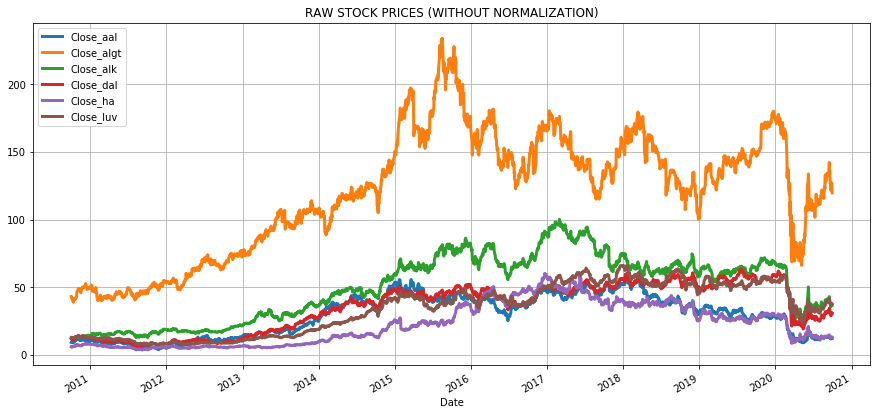

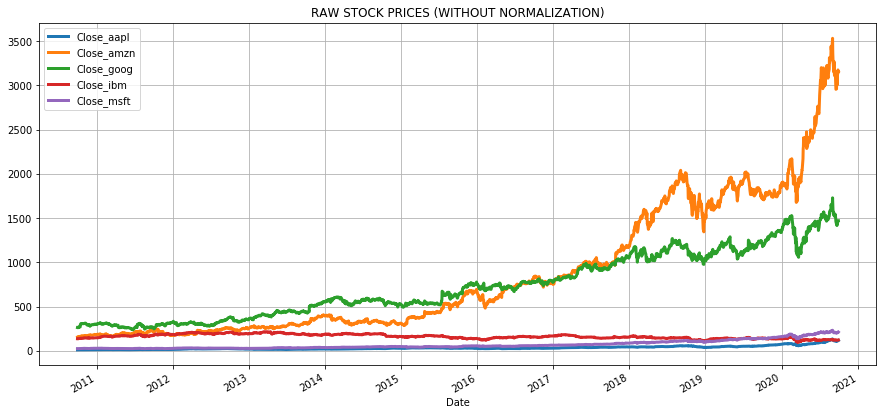

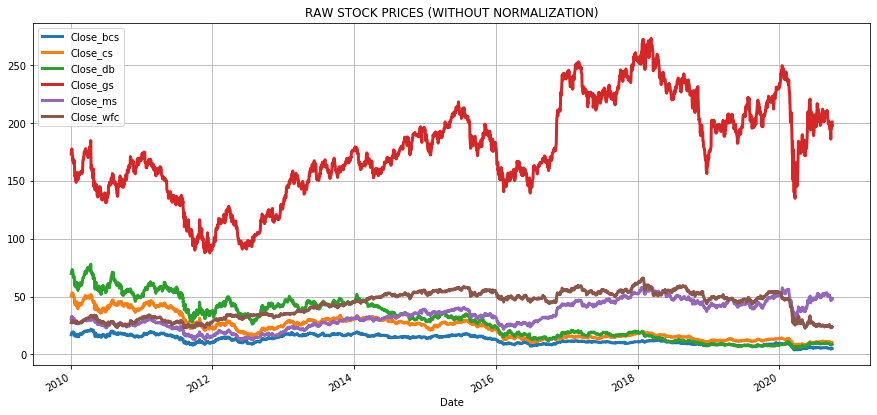

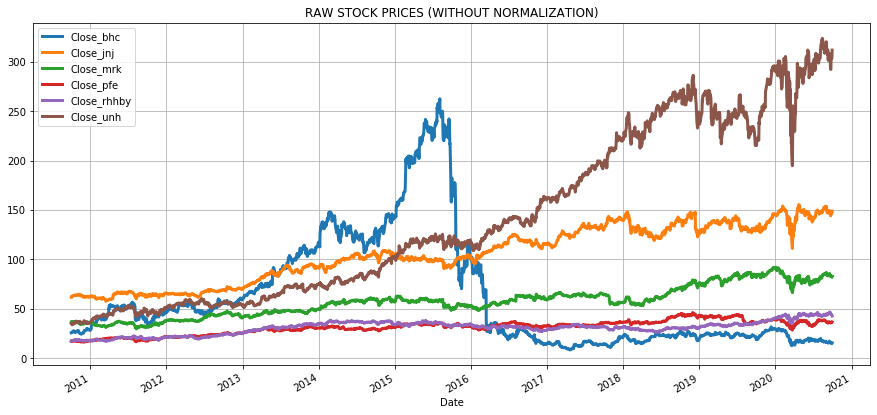

In [47]:
# Plot the non-normalized data
show_plot(avn_df, 'RAW STOCK PRICES (WITHOUT NORMALIZATION)')
show_plot(tech_df, 'RAW STOCK PRICES (WITHOUT NORMALIZATION)')
show_plot(fin_df, 'RAW STOCK PRICES (WITHOUT NORMALIZATION)')
show_plot(pharma_df, 'RAW STOCK PRICES (WITHOUT NORMALIZATION)')

In [48]:
# Function to perform an interactive data plotting using plotly express
# Plotly.express module which is imported as px includes functions that can plot interactive plots easily and effectively. 
# Every Plotly Express function uses graph objects internally and returns a plotly.graph_objects.Figure instance. 

def interactive_plot(df, title):
  fig = px.line(title = title)
  
  # Loop through each stock (while ignoring date column with index 0)
  for i in df.columns[1:]:
    fig.add_scatter(x = df['Date'], y = df[i], name = i) # add a new Scatter trace

  fig.show()

In [49]:
# Plot interactive chart
interactive_plot(avn_df, 'Closing Prices of stocks without normalization')
interactive_plot(tech_df, 'Closing Prices of stocks without normalization')
interactive_plot(fin_df, 'Closing Prices of stocks without normalization')
interactive_plot(pharma_df, 'Closing Prices of stocks without normalization')

In [50]:
# Function to normalize the prices based on the initial price
# The function simply divides every stock by it's price at the start date (i.e.: Date = 2010-01-10)	
def normalize(df):
  x = df.copy()

  # Loop through each stock (while ignoring the date column with index 0)
  for i in x.columns[1:]:
    x[i] = x[i]/x[i][0]
  return x

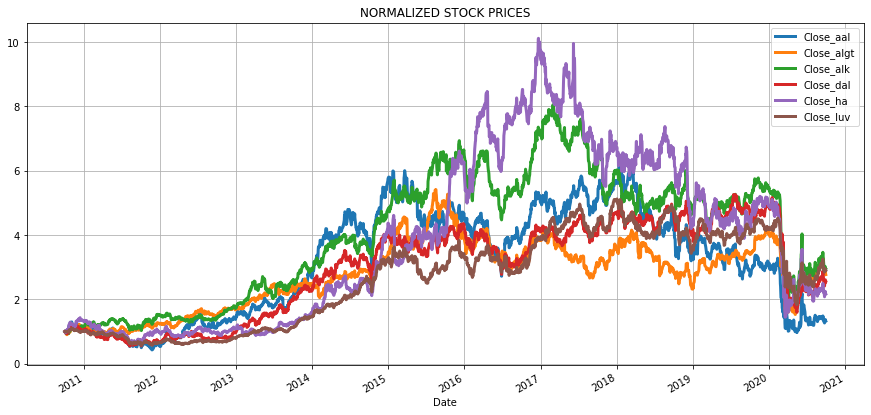

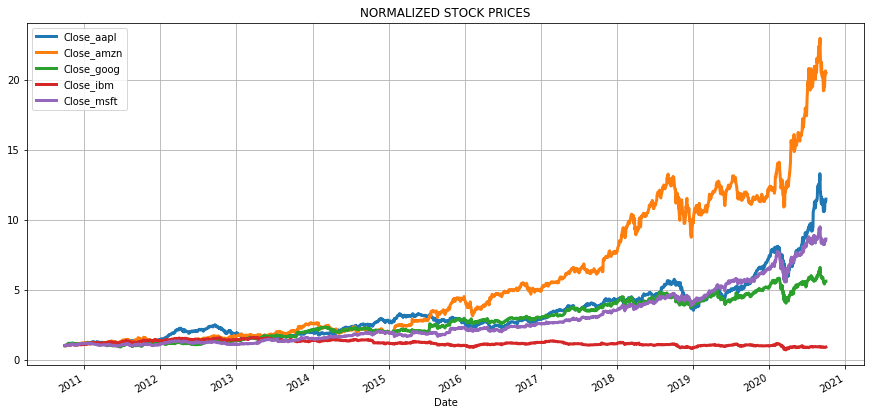

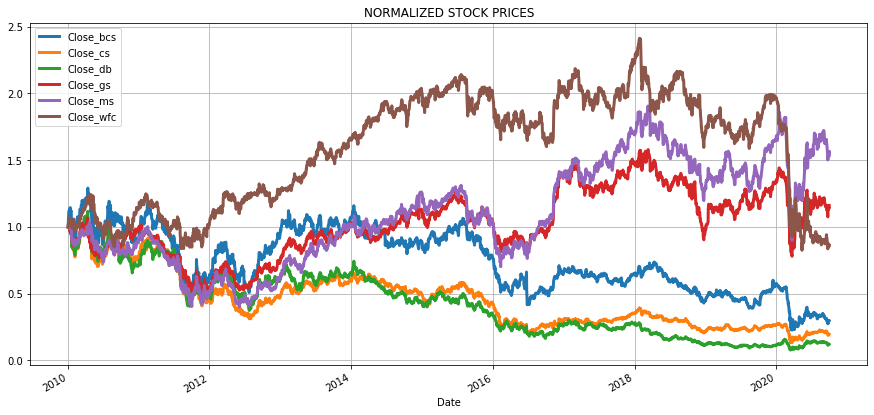

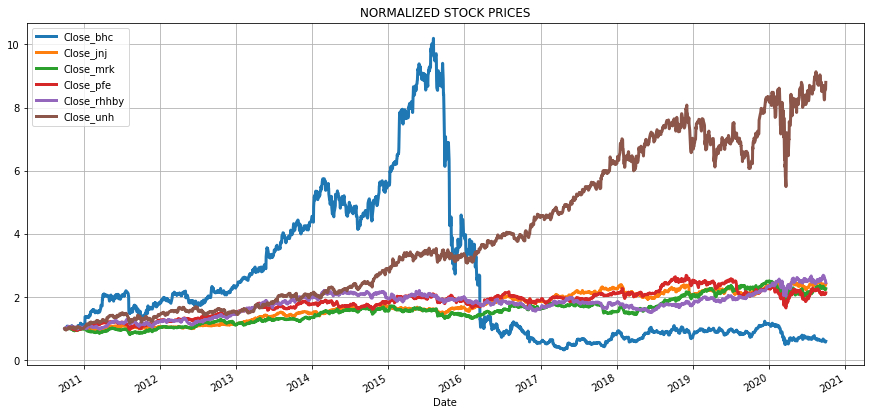

In [51]:
# Plot normalized data
show_plot(normalize(avn_df), 'NORMALIZED STOCK PRICES')
show_plot(normalize(tech_df), 'NORMALIZED STOCK PRICES')
show_plot(normalize(fin_df), 'NORMALIZED STOCK PRICES')
show_plot(normalize(pharma_df), 'NORMALIZED STOCK PRICES')

## Technical Analysis + EDA

In [11]:
# Step 1 - Descriptive Statistics
avn_df.describe()

,Close_aal,Close_algt,Close_alk,Close_dal,Close_ha,Close_luv
count,2517.000000,2517.000000,2517.000000,2517.000000,2517.000000,2517.000000
mean,29.397636,119.742177,50.031176,35.509420,22.870413,34.315443
std,15.211889,45.384355,24.187020,17.530221,15.483034,18.421698
min,4.000000,39.040001,11.620000,6.620000,3.780000,7.350000
25%,13.010000,79.180000,26.780001,16.240000,7.030000,13.270000
50%,32.520000,125.750000,58.540001,40.709999,21.910000,37.549999
75%,42.200001,152.949997,67.260002,50.360001,36.900002,51.880001
max,58.470001,233.979996,100.239998,63.160000,60.299999,66.290001


We observe that `ALGT` has a significantly higher average stock value as compared to other stocks. However its standard deviation is also pretty high

In [12]:
#Load SNP file
# Lets include the S&P data also into the main dataframe
df = pd.read_csv('./S&P500.csv')
df.drop(columns = ['Open','High','Low','Adj Close'], inplace = True)
df.columns = df.columns.map(lambda x: str(x) + '_SnP')
df['Date_SnP']= pd.to_datetime(df['Date_SnP'],dayfirst = True)
avn_df['Date'] = pd.to_datetime(avn_df['Date'], errors = 'coerce')
avn_snp = pd.merge(avn_df,df, how="inner", left_on="Date", right_on="Date_SnP")
avn_snp.drop(columns = ['Volume_SnP','Date_SnP'], inplace = True)

In [13]:
tech_df['Date'] = pd.to_datetime(tech_df['Date'], errors = 'coerce')
tech_snp = pd.merge(tech_df, df, how="inner", left_on="Date", right_on="Date_SnP")
tech_snp.drop(columns = ['Volume_SnP','Date_SnP'], inplace = True)

In [14]:
fin_df['Date'] = pd.to_datetime(fin_df['Date'], errors = 'coerce')
fin_snp = pd.merge(fin_df, df, how="inner", left_on="Date", right_on="Date_SnP")
fin_snp.drop(columns = ['Volume_SnP','Date_SnP'], inplace = True)

In [15]:
pharma_df['Date'] = pd.to_datetime(pharma_df['Date'], errors = 'coerce')
pharma_snp = pd.merge(pharma_df, df, how="inner", left_on="Date", right_on="Date_SnP")
pharma_snp.drop(columns = ['Volume_SnP','Date_SnP'], inplace = True)

In [16]:
#Sort everything by date
avn_snp = avn_snp.sort_values(by='Date')
fin_snp = fin_snp.sort_values(by='Date')
tech_snp = tech_snp.sort_values(by='Date')
pharma_snp = pharma_snp.sort_values(by='Date')

1. Descriptive Statistics - Let's start our EDA with some basic descriptive statistics

In [17]:
avn_snp.describe()

,Close_aal,Close_algt,Close_alk,Close_dal,Close_ha,Close_luv,Close_SnP
count,2517.000000,2517.000000,2517.000000,2517.000000,2517.000000,2517.000000,2517.000000
mean,29.397636,119.742177,50.031176,35.509420,22.870413,34.315443,2111.392732
std,15.211889,45.384355,24.187020,17.530221,15.483034,18.421698,612.227235
min,4.000000,39.040001,11.620000,6.620000,3.780000,7.350000,1099.229980
25%,13.010000,79.180000,26.780001,16.240000,7.030000,13.270000,1562.170044
50%,32.520000,125.750000,58.540001,40.709999,21.910000,37.549999,2071.219971
75%,42.200001,152.949997,67.260002,50.360001,36.900002,51.880001,2656.300049
max,58.470001,233.979996,100.239998,63.160000,60.299999,66.290001,3580.840088


In [18]:
avn_snp.describe()

,Close_aal,Close_algt,Close_alk,Close_dal,Close_ha,Close_luv,Close_SnP
count,2517.000000,2517.000000,2517.000000,2517.000000,2517.000000,2517.000000,2517.000000
mean,29.397636,119.742177,50.031176,35.509420,22.870413,34.315443,2111.392732
std,15.211889,45.384355,24.187020,17.530221,15.483034,18.421698,612.227235
min,4.000000,39.040001,11.620000,6.620000,3.780000,7.350000,1099.229980
25%,13.010000,79.180000,26.780001,16.240000,7.030000,13.270000,1562.170044
50%,32.520000,125.750000,58.540001,40.709999,21.910000,37.549999,2071.219971
75%,42.200001,152.949997,67.260002,50.360001,36.900002,51.880001,2656.300049
max,58.470001,233.979996,100.239998,63.160000,60.299999,66.290001,3580.840088


We observe that `ALGT` has a significantly higher average stock value as compared to other stocks. However its standard deviation is also pretty high

In [19]:
fin_snp.describe()

,Close_bcs,Close_cs,Close_db,Close_gs,Close_ms,Close_wfc,Close_SnP
count,2517.000000,2517.000000,2517.000000,2517.000000,2517.000000,2517.000000,2517.000000
mean,12.192705,21.501379,27.304930,179.598184,34.411136,44.473206,2111.392732
std,3.729666,8.988043,15.409974,42.405475,11.610042,10.813651,612.227235
min,3.840000,6.670000,5.480000,87.699997,12.360000,22.530001,1099.229980
25%,9.220000,13.740000,13.470000,154.990005,25.570000,33.959999,1562.170044
50%,11.345622,19.639999,28.370001,177.229996,33.520000,48.110001,2071.219971
75%,15.720000,27.750000,41.049618,211.580002,44.020000,53.419998,2656.300049
max,19.944700,46.513672,62.624046,273.380005,58.910000,65.930000,3580.840088


Here also we're observing some outliers in the average stock values. `GS` has significantly higher mean and standard deviation as compared to other stocks.

In [20]:
tech_snp.describe()

,Close_aapl,Close_amzn,Close_goog,Close_ibm,Close_msft,Close_SnP
count,2517.000000,2517.000000,2517.000000,2517.000000,2517.000000,2517.000000
mean,33.454670,854.636107,730.426139,161.805364,68.195050,2111.392732
std,20.630118,745.201139,364.685720,24.729858,47.250558,612.227235
min,9.951428,153.029999,236.553345,94.769997,23.709999,1099.229980
25%,18.961428,266.489990,403.642059,143.490005,31.799999,1562.170044
50%,27.592501,533.750000,651.789978,159.529999,48.619999,2071.219971
75%,42.962502,1500.000000,1055.810059,183.990005,93.919998,2656.300049
max,134.179993,3531.449951,1728.280029,215.800003,231.649994,3580.840088


`AMZN` and `GOOG` have huge mean stock prices as compared to others. `AMZN` also has a significantly volatile stock since it's standard deviation is very high and very close to its mean. `GOOG` also has a volatile stock value but not as much as `AMZN`

In [21]:
fb_df.describe()

,Close_fb,Volume_fb
count,2106.000000,2.106000e+03
mean,119.599425,3.254995e+07
std,63.839134,2.889302e+07
min,17.730000,5.913100e+06
25%,68.429998,1.632122e+07
50%,118.680000,2.372640e+07
75%,173.980003,3.847328e+07
max,303.910004,5.735764e+08


`FB` doesn't have that 

In [22]:
pharma_snp.describe()

,Close_bhc,Close_jnj,Close_mrk,Close_pfe,Close_rhhby,Close_unh,Close_SnP
count,2517.000000,2517.000000,2517.000000,2517.000000,2517.000000,2517.000000,2517.000000
mean,61.880687,105.277378,57.161053,31.314883,30.835677,141.230377,2111.392732
std,57.170002,28.174233,15.164505,6.865147,6.582239,85.118334,612.227235
min,8.510000,57.660000,29.809999,16.299999,17.125000,33.950001,1099.229980
25%,22.170000,81.930000,45.730000,28.040001,27.719999,59.480000,1562.170044
50%,38.759998,104.040001,57.180000,32.450001,31.750000,118.690002,2071.219971
75%,90.269997,130.979996,64.089996,35.799999,34.814999,226.639999,2656.300049
max,262.519989,155.509995,92.040001,46.230000,46.840000,323.700012,3580.840088


`JNJ` and `UNH` have higher mean stock prices, but the former is more stable than the latter. `UNH` has a huge standard deviation

`FB` also has a higher mean stock value as compared to 

In [23]:
#Let's compute the daily returns

In [26]:
#For creating interactive plots
def interactive_plot(df, title):
  fig = px.line(title = title)
  
  # Loop through each stock (while ignoring date column with index 0)
  for i in df.columns[1:]:
    fig.add_scatter(x = df['Date'], y = df[i], name = i) # add a new Scatter trace

  fig.show()

In [27]:
#Step - 2 - Daily returns computation
#Let's write a function to do the same
def daily_return(df):
  df_daily_return = df.copy()

  # Loop through each stock (while ignoring time columns with index 0)
  for i in df.columns[1:]:
    
    # Loop through each row belonging to the stock
    for j in range(1, len(df)):

      # Calculate the percentage of change from the previous day
      df_daily_return[i][j] = ((df[i][j]- df[i][j-1])/df[i][j-1]) * 100
    
    # set the value of first row to zero since the previous value is not available
    df_daily_return[i][0] = 0
  
  return df_daily_return

In [28]:
#Let's run it for all the stocks
stocks_daily_return_avn = daily_return(avn_snp)

In [29]:
stocks_daily_return_avn.head()

,Date,Close_aal,Close_algt,Close_alk,Close_dal,Close_ha,Close_luv,Close_SnP
0,2010-10-01,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,2010-10-04,-1.829925,-3.793662,-2.450291,-4.163197,-3.523490,-0.927357,-0.803493
2,2010-10-05,1.206140,1.226252,0.597076,2.780191,1.739130,1.560062,2.086134
3,2010-10-06,0.000000,-0.356287,-0.225133,-0.422654,2.051282,-0.614439,-0.067200
4,2010-10-07,0.108342,-0.595948,-4.615385,-0.084890,3.015075,-0.463679,-0.164652


In [30]:
stocks_daily_return_tech = daily_return(tech_snp)
stocks_daily_return_fin = daily_return(fin_snp)
stocks_daily_return_pharma= daily_return(pharma_snp)

In [32]:
# Plotting the returns vs. date using interactive plots
interactive_plot(stocks_daily_return_avn,'Daily Returns')

In [33]:
interactive_plot(stocks_daily_return_tech,'Daily Returns')

In [34]:
# Plotting the returns vs. date using interactive plots
interactive_plot(stocks_daily_return_fin,'Daily Returns')

In [35]:
# Plotting the returns vs. date using interactive plots
interactive_plot(stocks_daily_return_pharma,'Daily Returns')

In [36]:
##Let's check some pairplots as well.

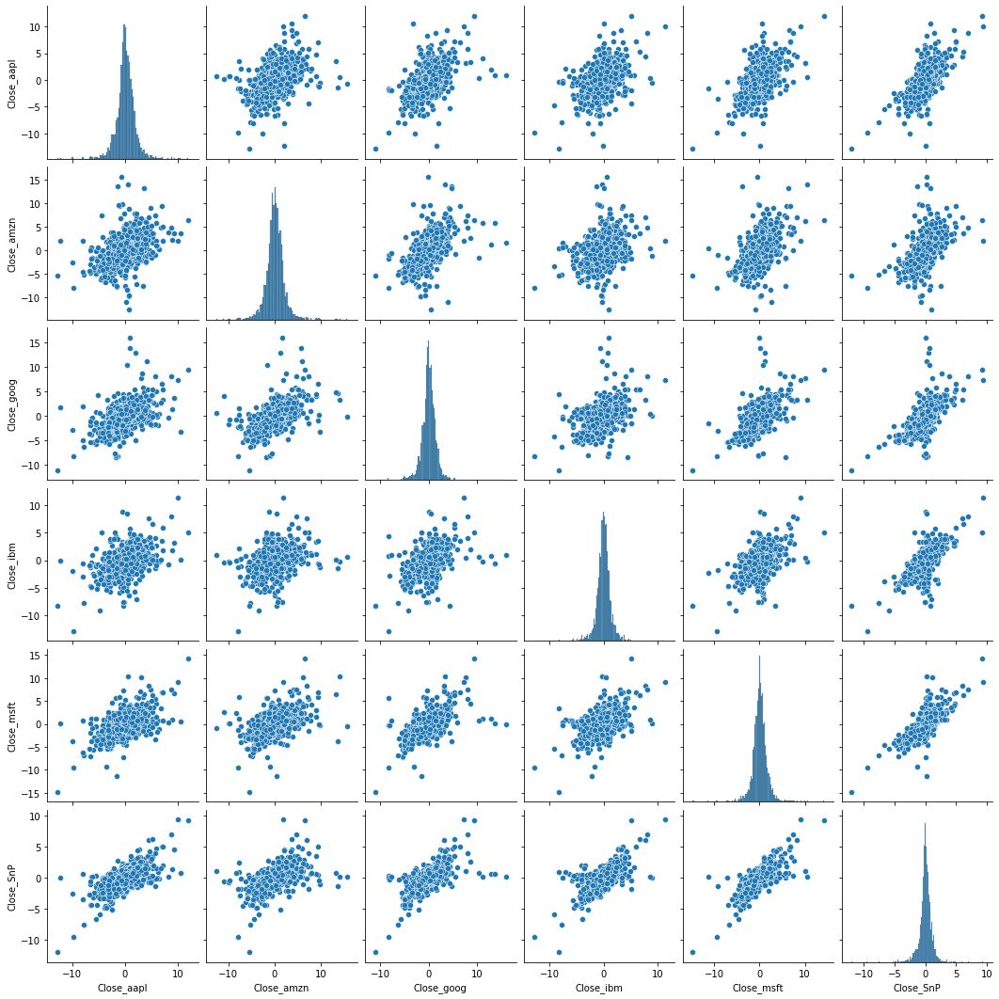

In [30]:
sns.pairplot(stocks_daily_return_tech)

Tech Stocks form a nearly correlated movement with each other and the S&P prices.

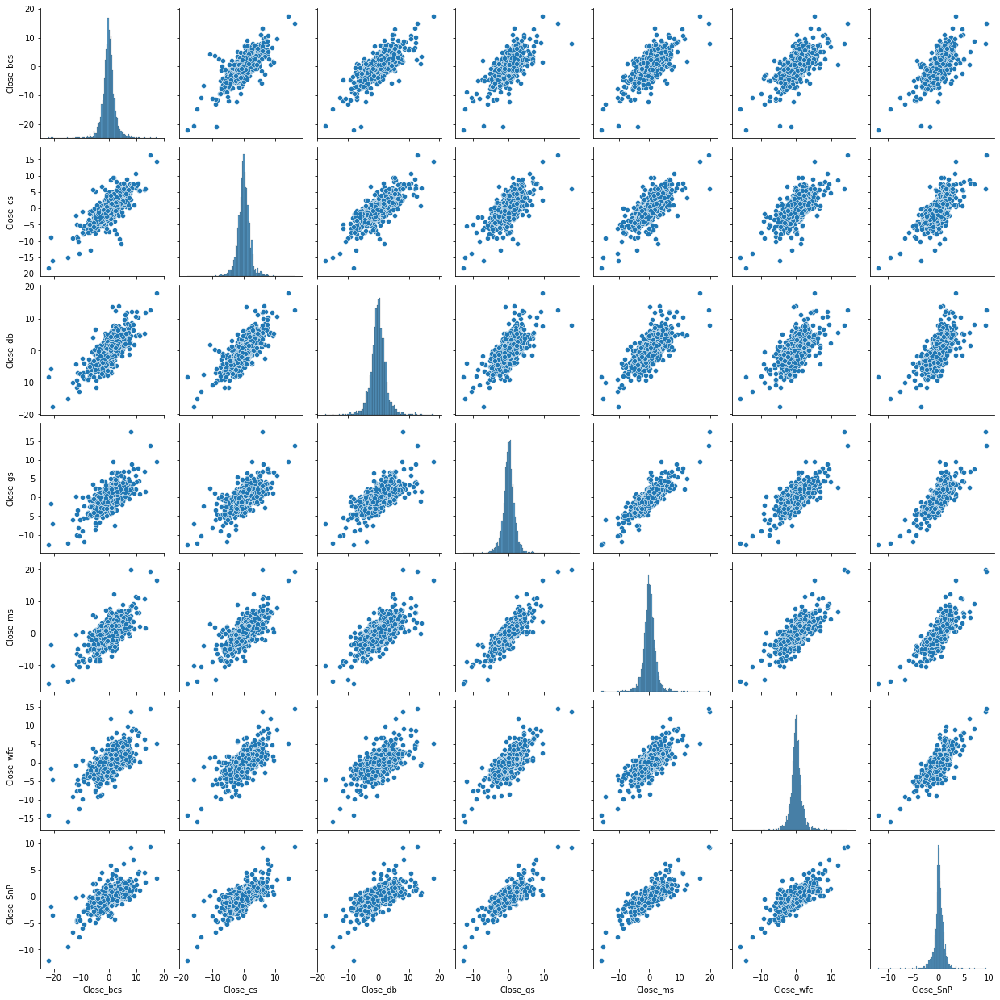

In [31]:
sns.pairplot(stocks_daily_return_fin)

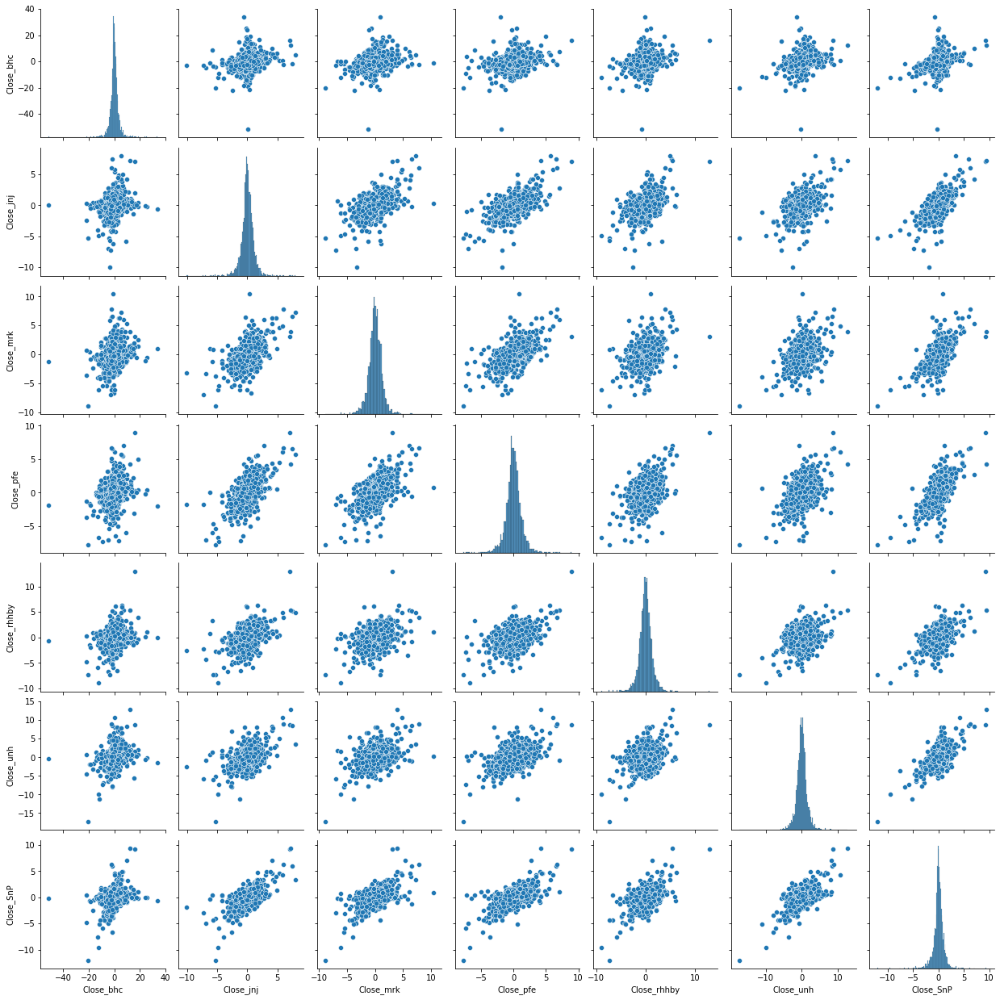

In [103]:
sns.pairplot(stocks_daily_return_pharma)

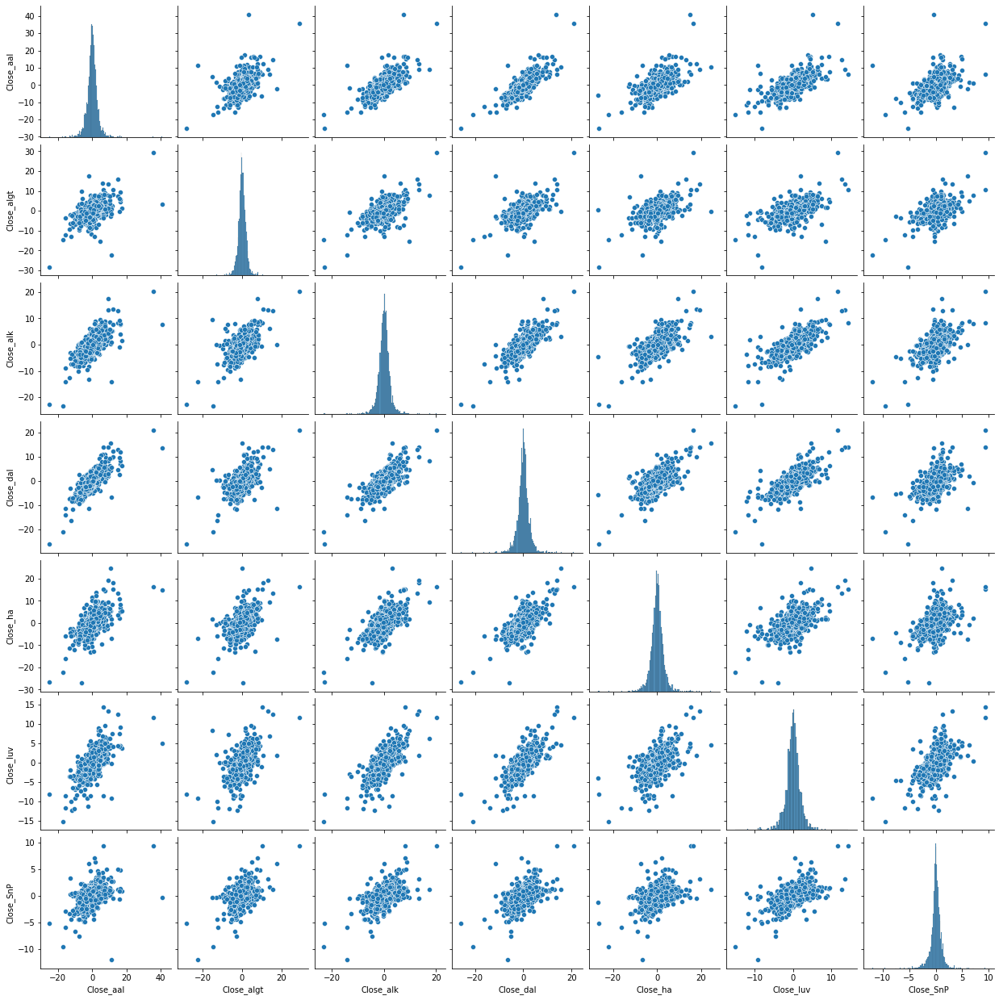

In [32]:
sns.pairplot(stocks_daily_return_avn)

In [37]:
stocks_daily_return_fb = daily_return(fb_df)

In [38]:
stocks_daily_return_fb

,Date_fb,Close_fb,Volume_fb
0,18-05-2012,0.000000,0.000000
1,21-05-2012,-10.986139,-70.676496
2,22-05-2012,-8.903906,-39.482154
3,23-05-2012,3.225806,-27.691857
4,24-05-2012,3.218747,-31.742935
...,...,...,...
2101,24-09-2020,0.204801,1.860875
2102,25-09-2020,2.119989,-8.274687
2103,28-09-2020,0.784868,2.588372
2104,29-09-2020,1.935208,7.297770


In [39]:
stocks_daily_return_fb['Date_fb'] = pd.to_datetime(stocks_daily_return_fb['Date_fb'], errors = 'coerce')
stocks_daily_return_fb = stocks_daily_return_fb.drop('Volume_fb',axis = 1)
stocks_daily_return_fb = stocks_daily_return_fb.rename(columns = {'Date_fb':'Date'})
stocks_daily_return_fb

,Date,Close_fb
0,2012-05-18,0.000000
1,2012-05-21,-10.986139
2,2012-05-22,-8.903906
3,2012-05-23,3.225806
4,2012-05-24,3.218747
...,...,...
2101,2020-09-24,0.204801
2102,2020-09-25,2.119989
2103,2020-09-28,0.784868
2104,2020-09-29,1.935208


In [41]:
m1 = pd.merge(stocks_daily_return_fb,stocks_daily_return_tech.drop(columns = 'Close_SnP'), how="inner", on="Date")
m2 = pd.merge(m1, stocks_daily_return_pharma.drop(columns = 'Close_SnP'), how="inner", on ="Date")
m3 = pd.merge(m2, stocks_daily_return_avn.drop(columns = 'Close_SnP'), how="inner", on="Date")
m4 = pd.merge(m3, stocks_daily_return_fin, how="inner", on="Date")
#pharma_stocks = pd.merge(m4, pharma_unh_df, how="inner", left_on="Date_bhc", right_on="Date_unh")

In [42]:
m4.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1861 entries, 0 to 1860
Data columns (total 26 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   Date         1861 non-null   datetime64[ns]
 1   Close_fb     1861 non-null   float64       
 2   Close_aapl   1861 non-null   float64       
 3   Close_amzn   1861 non-null   float64       
 4   Close_goog   1861 non-null   float64       
 5   Close_ibm    1861 non-null   float64       
 6   Close_msft   1861 non-null   float64       
 7   Close_bhc    1861 non-null   float64       
 8   Close_jnj    1861 non-null   float64       
 9   Close_mrk    1861 non-null   float64       
 10  Close_pfe    1861 non-null   float64       
 11  Close_rhhby  1861 non-null   float64       
 12  Close_unh    1861 non-null   float64       
 13  Close_aal    1861 non-null   float64       
 14  Close_algt   1861 non-null   float64       
 15  Close_alk    1861 non-null   float64       
 16  Close_

In [43]:
m4.head(10)

,Date,Close_fb,Close_aapl,Close_amzn,Close_goog,Close_ibm,Close_msft,Close_bhc,Close_jnj,Close_mrk,...,Close_dal,Close_ha,Close_luv,Close_bcs,Close_cs,Close_db,Close_gs,Close_ms,Close_wfc,Close_SnP
0,2012-05-18,0.000000,0.049036,-2.065394,-3.635344,-1.015713,-1.514129,-2.589064,-0.314714,-0.552193,...,-2.593660,0.189753,-2.395210,-1.846962,0.925449,0.502224,-1.637829,-0.817236,-1.590331,-0.738778
1,2012-05-21,-10.986139,5.826010,1.992048,2.283479,0.959766,1.639904,0.340208,0.189429,-0.581708,...,4.339250,0.757576,2.331288,3.763453,1.935814,3.303726,1.068179,-1.198502,1.486745,1.603590
2,2012-05-22,-8.903906,-0.767875,-1.274586,-2.167367,-0.475318,0.033613,1.250265,0.078776,-0.372338,...,-0.378072,-1.691729,-0.839329,1.727099,1.649172,-0.268748,1.056882,0.909780,0.859873,0.048634
3,2012-05-23,3.225806,2.439977,0.905585,1.441416,-0.355661,-2.184136,-2.365000,-0.393577,-0.320339,...,1.897533,2.868069,1.088271,-1.103550,-0.491641,-0.080838,0.522918,0.450789,0.221029,0.169370
4,2012-05-24,3.218747,-0.918387,-0.938878,-0.951669,-0.015296,-0.137413,2.979633,-0.268693,0.696299,...,4.934823,5.576208,4.545455,0.085831,-0.543479,-1.564191,-1.203590,-0.448766,0.220539,0.138003
5,2012-05-25,-3.390854,-0.535988,-1.091807,-2.009401,-0.912843,-0.034403,0.915901,-0.935024,-0.132976,...,0.887311,0.000000,0.228833,-1.972560,-1.788373,0.493154,-0.165191,-0.450789,0.157190,-0.216563
6,2012-05-29,-9.620809,1.774882,0.873691,0.475038,1.111685,1.720578,-0.165012,0.127983,0.106527,...,3.781882,0.000000,2.054795,1.137361,-0.050584,-0.054529,1.199591,2.943396,1.224102,1.107898
7,2012-05-30,-2.253811,1.205732,-2.570433,-1.028037,-0.982392,-0.744246,-0.991744,-0.607127,-0.505448,...,-0.423729,-1.936620,-0.782998,-3.373712,-2.125505,-2.755048,-3.321071,-4.032258,-1.705423,-1.433489
8,2012-05-31,5.001770,-0.248629,1.758834,-1.252910,-0.837920,-0.511244,1.544245,0.353643,0.481283,...,2.978723,3.770197,1.803833,-1.074296,-1.085832,0.925674,1.152094,2.062643,1.104095,-0.227667
9,2012-01-06,-6.351355,1.045377,2.815157,-1.364166,-1.148062,1.553472,0.678541,-0.871560,-0.696957,...,-0.120048,0.367647,-1.160093,-0.864305,-3.292896,-5.437486,-1.226479,-2.334158,-0.275669,-0.253696


In [44]:
col = m4.columns[1:]

In [45]:
len(col)

25

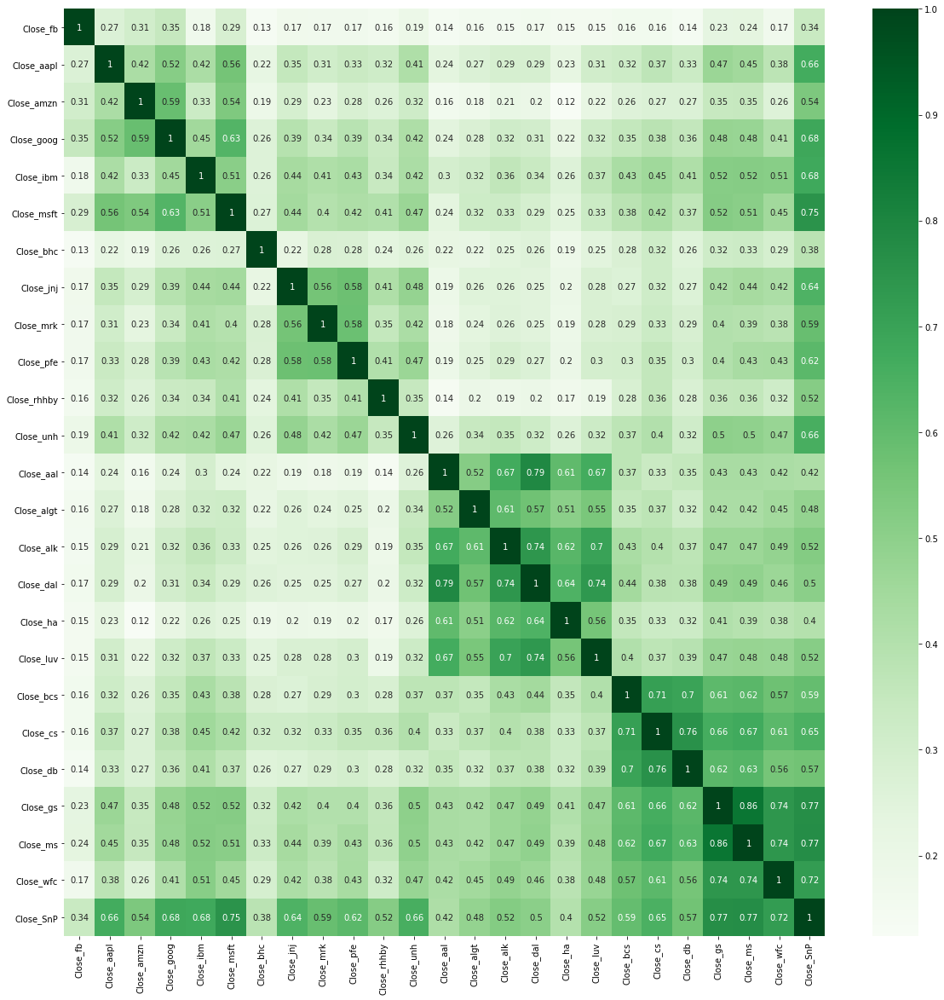

In [75]:
#Correlation analysis
plt.figure(figsize = [20,20])
sns.heatmap(np.corrcoef(m4.drop(columns='Date').T),annot = True,cmap = 'Greens',xticklabels = col,yticklabels = col)

# Observations

1. All the stocks belonging to the same industry are well correlated
2. Finance and SnP have good correlations with other industry stocks
3. BHC is not well correlated with the rest of the stocks
4. Aviation and Technology are not well correlated. This indicates that if we need to diversify our portfolio, stocks need to be bought from these two industries.


In [76]:
stock_stats = m4.describe().T[['mean','std']]

In [77]:
stock_stats = stock_stats.rename(columns = {'mean': 'Avg. daily return','std':'Risk'})

In [78]:
stock_stats.head()

,Avg. daily return,Risk
Close_fb,0.126507,2.398393
Close_aapl,0.121915,1.758228
Close_amzn,0.155052,1.925505
Close_goog,0.087132,1.606975
Close_ibm,0.001495,1.413808


In [210]:
stock_stats['Industry'] = 0
stock_stats['Industry'][0:6] = 'tech'
stock_stats['Industry'][6:12] = 'pharma'
stock_stats['Industry'][12:18]= 'aviation'
stock_stats['Industry'][18:24]= 'finance'
stock_stats['Industry'][24] = 'SnP'

C:\Users\mahi1\anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
C:\Users\mahi1\anaconda3\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until
C:\Users\mahi1\anaconda3\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing t

In [211]:
stock_stats

,Avg. daily return,Risk,Industry
Close_fb,0.126507,2.398393,tech
Close_aapl,0.121915,1.758228,tech
Close_amzn,0.155052,1.925505,tech
Close_goog,0.087132,1.606975,tech
Close_ibm,0.001495,1.413808,tech
Close_msft,0.114739,1.645247,tech
Close_bhc,-0.005617,3.690837,pharma
Close_jnj,0.043954,1.109104,pharma
Close_mrk,0.047234,1.291922,pharma
Close_pfe,0.038675,1.224357,pharma


In [212]:
stock_stats.sort_values(by = 'Avg. daily return', ascending = False)

,Avg. daily return,Risk,Industry
Close_amzn,0.155052,1.925505,tech
Close_fb,0.126507,2.398393,tech
Close_aapl,0.121915,1.758228,tech
Close_msft,0.114739,1.645247,tech
Close_ha,0.109862,2.980946,aviation
Close_dal,0.096684,2.363009,aviation
Close_unh,0.096035,1.629163,pharma
Close_alk,0.093396,2.278577,aviation
Close_goog,0.087132,1.606975,tech
Close_luv,0.086966,2.001833,aviation


In [213]:
stock_stats.sort_values(by = 'Risk')

,Avg. daily return,Risk,Industry
Close_SnP,0.059978,1.037411,SnP
Close_jnj,0.043954,1.109104,pharma
Close_pfe,0.038675,1.224357,pharma
Close_rhhby,0.047054,1.260099,pharma
Close_mrk,0.047234,1.291922,pharma
Close_ibm,0.001495,1.413808,tech
Close_goog,0.087132,1.606975,tech
Close_unh,0.096035,1.629163,pharma
Close_msft,0.114739,1.645247,tech
Close_wfc,0.028821,1.658896,finance


# Observations II
1. Tech industry stocks have good average daily returns but they also are slightly riskier. AMZN is the best performing stock followed by the other stocks.
2. The top 10 stocks are mostly filled with aviation and tech stocks. As per the previous analysis, they're also less correlated as compared to other pairs.This will be useful in providing recommendations to the investors.
3. Pharma and finance stocks don't have high returns and are also slightly correlated with the other top performing stocks. Therefore, choosing them won't make much sense since they don't increase the returns or help in diversifying the portfolio to a greater extent.

## Recommendations

We will recommend both Peter and Patrick to choose 4 or 5 stocks from the tech and the aviation industry. Let's try out a few options and analyse the portfolio performance

### Recommendations for Mr Patrick

#### Portfolio 1 

Let's create a portfolio for Mr Patrick first. Let's choose the following stocks

- `AMZN`
- `AAPL`
- `HA`
- `DAL`
- `UNH`

Rationale - `AMZN` and `AAPL` have higher returns, `HA` and `DAL` are less correlated with the first two stocks chosen and hence is more suitable for diversification. Similarly `UNH` has been chosen as it's moderately correlated and has good returns

Now for creating the portfolio, we need the data on the returns for the last 5 years assuming that they'll be replicated in the next 5 years.

In [ ]:
#Need to perfrom a few additional merge operations

In [163]:
n1 = pd.merge(fb_df2,tech_snp.drop(columns = 'Close_SnP'), how="inner", on="Date")
n2 = pd.merge(n1, pharma_snp.drop(columns = 'Close_SnP'), how="inner", on ="Date")
n3 = pd.merge(n2, avn_snp.drop(columns = 'Close_SnP'), how="inner", on="Date")
n4 = pd.merge(n3, fin_snp, how="inner", on="Date")

In [164]:
fin = n4.sort_values(by = 'Date')

In [166]:
fin2 = fin.reset_index(drop = True)

In [167]:
fin2

,Date,Close_fb,Close_aapl,Close_amzn,Close_goog,Close_ibm,Close_msft,Close_bhc,Close_jnj,Close_mrk,...,Close_dal,Close_ha,Close_luv,Close_bcs,Close_cs,Close_db,Close_gs,Close_ms,Close_wfc,Close_SnP
0,2012-05-18,38.230000,18.942142,213.850006,299.078979,195.880005,29.270000,47.029999,63.349998,37.820000,...,10.140000,5.28,8.150000,10.285714,19.169922,34.370228,95.489998,13.350000,30.940001,1295.219971
1,2012-05-21,34.029999,20.045713,218.110001,305.908386,197.759995,29.750000,47.189999,63.470001,37.599998,...,10.580000,5.32,8.340000,10.672812,19.541016,35.505726,96.510002,13.190000,31.400000,1315.989990
2,2012-05-22,31.000000,19.891787,215.330002,299.278229,196.820007,29.760000,47.779999,63.520000,37.459999,...,10.540000,5.23,8.270000,10.857142,19.863281,35.410305,97.529999,13.310000,31.670000,1316.630005
3,2012-05-23,32.000000,20.377142,217.279999,303.592072,196.119995,29.110001,46.650002,63.270000,37.340000,...,10.740000,5.38,8.360000,10.737328,19.765625,35.381680,98.040001,13.370000,31.740000,1318.859985
4,2012-05-24,33.029999,20.190001,215.240005,300.702881,196.089996,29.070000,48.040001,63.099998,37.599998,...,11.270000,5.68,8.740000,10.746544,19.658203,34.828243,96.860001,13.310000,31.809999,1320.680054
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2101,2020-09-24,249.529999,108.220001,3019.790039,1428.290039,118.089996,203.190002,15.220000,144.669998,83.150002,...,29.010000,12.40,36.860001,4.750000,9.620000,8.110000,195.110001,46.610001,23.320000,3246.590088
2102,2020-09-25,254.820007,112.279999,3095.129883,1444.959961,118.949997,207.820007,15.300000,145.660004,82.930000,...,29.780001,12.80,37.099998,4.700000,9.480000,8.000000,194.949997,47.040001,23.639999,3298.459961
2103,2020-09-28,256.820007,114.959999,3174.050049,1464.520020,121.730003,209.440002,15.270000,147.110001,82.760002,...,31.340000,13.38,38.240002,4.990000,9.900000,8.430000,199.070007,48.380001,23.820000,3351.600098
2104,2020-09-29,261.790009,114.089996,3144.879883,1469.329956,120.940002,207.259995,14.880000,147.059998,81.900002,...,30.610001,12.86,37.610001,4.960000,9.830000,8.270000,196.789993,47.240002,23.260000,3335.469971


In [168]:
#For getting the data from last 5 years(i.e. from 1-10-2015) we need to check the index from where it starts

fin2[(fin2['Date'].dt.year == 2015) & (fin2['Date'].dt.month == 10)]

,Date,Close_fb,Close_aapl,Close_amzn,Close_goog,Close_ibm,Close_msft,Close_bhc,Close_jnj,Close_mrk,...,Close_dal,Close_ha,Close_luv,Close_bcs,Close_cs,Close_db,Close_gs,Close_ms,Close_wfc,Close_SnP
847,2015-10-01,90.949997,27.395000,520.719971,611.289978,143.589996,44.610001,179.600006,93.169998,49.369999,...,45.410000,24.730000,38.410000,15.01,24.090000,26.520000,176.020004,31.500000,51.439999,1923.819946
848,2015-10-02,92.070000,27.594999,532.539978,626.909973,144.580002,45.570000,182.320007,93.930000,50.139999,...,44.869999,24.280001,38.380001,15.39,24.639999,27.139999,177.009995,31.430000,51.259998,1951.359985
849,2015-10-05,94.010002,27.695000,543.679993,641.469971,149.039993,46.630001,163.460007,94.760002,51.230000,...,46.959999,25.500000,39.299999,15.60,25.160000,28.200001,180.699997,32.290001,52.410000,1987.050049
850,2015-10-06,92.800003,27.827499,537.479980,645.440002,148.779999,46.750000,166.000000,93.419998,49.799999,...,45.090000,24.250000,38.000000,15.55,25.379999,28.400000,180.320007,32.360001,52.029999,1979.920044
851,2015-10-07,92.400002,27.695000,541.940002,642.359985,150.089996,46.799999,169.830002,94.980003,50.950001,...,45.990002,24.559999,38.709999,15.73,25.320000,28.790001,182.229996,32.930000,52.189999,1995.829956
852,2015-10-08,92.470001,27.375000,533.159973,639.159973,152.279999,47.450001,171.169998,95.080002,51.020000,...,45.959999,26.090000,38.759998,15.81,24.530001,28.389999,181.070007,32.990002,52.540001,2013.430054
853,2015-10-09,93.239998,28.030001,539.799988,643.609985,152.389999,47.110001,175.940002,95.370003,50.950001,...,47.209999,27.290001,39.939999,15.71,24.770000,29.340000,179.190002,32.720001,52.139999,2014.890015
854,2015-10-12,94.260002,27.900000,550.190002,646.669983,151.139999,47.000000,173.850006,95.989998,50.709999,...,48.500000,28.129999,41.220001,15.73,25.080000,29.139999,180.229996,32.799999,52.180000,2017.459961
855,2015-10-13,94.120003,27.947500,548.900024,652.299988,149.619995,46.889999,166.500000,95.449997,49.470001,...,47.730000,28.290001,40.820000,15.16,24.780001,28.780001,180.970001,32.610001,51.860001,2003.689941
856,2015-10-14,94.070000,27.552500,544.830017,651.159973,150.009995,46.680000,177.289993,94.529999,49.540001,...,48.590000,27.809999,40.840000,15.11,24.809999,28.900000,179.509995,32.540001,51.500000,1994.239990


Thus row 847 onwards we have the data from the last 5 years. Let's build our portfolio

In [172]:
portfolio1 = fin2[847::][['Date','Close_amzn','Close_aapl','Close_dal','Close_ha','Close_unh']]

In [173]:
portfolio1 = portfolio1.sort_values(by = 'Date')

In [174]:
portfolio1

,Date,Close_amzn,Close_aapl,Close_dal,Close_ha,Close_unh
847,2015-10-01,520.719971,27.395000,45.410000,24.730000,116.610001
848,2015-10-02,532.539978,27.594999,44.869999,24.280001,118.830002
849,2015-10-05,543.679993,27.695000,46.959999,25.500000,119.650002
850,2015-10-06,537.479980,27.827499,45.090000,24.250000,116.050003
851,2015-10-07,541.940002,27.695000,45.990002,24.559999,116.430000
...,...,...,...,...,...,...
2101,2020-09-24,3019.790039,108.220001,29.010000,12.400000,292.660004
2102,2020-09-25,3095.129883,112.279999,29.780001,12.800000,302.500000
2103,2020-09-28,3174.050049,114.959999,31.340000,13.380000,303.230011
2104,2020-09-29,3144.879883,114.089996,30.610001,12.860000,304.149994


In [176]:
port1 = portfolio1.reset_index(drop = True)

In [177]:
port1

,Date,Close_amzn,Close_aapl,Close_dal,Close_ha,Close_unh
0,2015-10-01,520.719971,27.395000,45.410000,24.730000,116.610001
1,2015-10-02,532.539978,27.594999,44.869999,24.280001,118.830002
2,2015-10-05,543.679993,27.695000,46.959999,25.500000,119.650002
3,2015-10-06,537.479980,27.827499,45.090000,24.250000,116.050003
4,2015-10-07,541.940002,27.695000,45.990002,24.559999,116.430000
...,...,...,...,...,...,...
1254,2020-09-24,3019.790039,108.220001,29.010000,12.400000,292.660004
1255,2020-09-25,3095.129883,112.279999,29.780001,12.800000,302.500000
1256,2020-09-28,3174.050049,114.959999,31.340000,13.380000,303.230011
1257,2020-09-29,3144.879883,114.089996,30.610001,12.860000,304.149994


In [178]:
def normalize(df):
  x = df.copy()

  # Loop through each stock (while ignoring the date column with index 0)
  for i in x.columns[1:]:
    x[i] = x[i]/x[i][0]
  return x

In [179]:
def portfolio_allocation(df, weights):

  df_portfolio = df.copy()
  
  # Normalize the stock avalues 
  df_portfolio = normalize(df_portfolio)
  
  for counter, stock in enumerate(df_portfolio.columns[1:]):
    df_portfolio[stock] = df_portfolio[stock] * weights[counter]
    df_portfolio[stock] = df_portfolio[stock] * 500000

  df_portfolio['Portfolio Daily Value in $'] = df_portfolio[df_portfolio != 'Date'].sum(axis = 1)
  
  df_portfolio['portfolio daily % return'] = 0.0000

  for i in range(1, len(df)):
    
    # Calculate the percentage of change from the previous day
    df_portfolio['portfolio daily % return'][i] = ( (df_portfolio['Portfolio Daily Value in $'][i] - df_portfolio['Portfolio Daily Value in $'][i-1]) / df_portfolio['Portfolio Daily Value in $'][i-1]) * 100 
  
  # set the value of first row to zero, as previous value is not available
  df_portfolio['portfolio daily % return'][0] = 0
  return df_portfolio

In [180]:
weights = np.array([0.2,0.2,0.2,0.2,0.2])

In [181]:
weights

array([0.2, 0.2, 0.2, 0.2, 0.2])

In [182]:
portn = portfolio_allocation(port1,weights).copy()

C:\Users\mahi1\anaconda3\lib\site-packages\pandas\core\ops\array_ops.py:253: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  res_values = method(rvalues)
C:\Users\mahi1\anaconda3\lib\site-packages\ipykernel_launcher.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\mahi1\anaconda3\lib\site-packages\ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [183]:
portn

,Date,Close_amzn,Close_aapl,Close_dal,Close_ha,Close_unh,Portfolio Daily Value in $,portfolio daily % return
0,2015-10-01,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,5.000000e+05,0.000000
1,2015-10-02,102269.935408,100730.056580,98810.832416,98180.351799,101903.782678,5.018950e+05,0.378992
2,2015-10-05,104409.283930,101095.090345,103413.342876,103113.627173,102606.981369,5.146383e+05,2.539051
3,2015-10-06,103218.622279,101578.751597,99295.309403,98059.037606,99519.768463,5.016715e+05,-2.519602
4,2015-10-07,104075.132928,101095.090345,101277.256111,99312.571775,99845.638454,5.056057e+05,0.784218
...,...,...,...,...,...,...,...,...
1254,2020-09-24,579925.911657,395035.594087,63884.606915,50141.528508,250973.331181,1.339961e+06,0.406097
1255,2020-09-25,594394.310834,409855.809454,65580.270865,51758.997169,259411.712037,1.381001e+06,3.062785
1256,2020-09-28,609550.281489,419638.616536,69015.635323,54104.326729,260037.739816,1.412347e+06,2.269766
1257,2020-09-29,603948.390334,416462.843585,67408.062101,52001.617469,260826.679866,1.400648e+06,-0.828338


In [184]:
# Cummulative return of the portfolio (Note that we now look for the last net worth of the portfolio compared to it's start value)
cummulative_return = ((portn['Portfolio Daily Value in $'][-1:] - portn['Portfolio Daily Value in $'][0])/ portn['Portfolio Daily Value in $'][0]) * 100
print('Cummulative return of the portfolio is {} %'.format(cummulative_return.values[0]))

Cummulative return of the portfolio is 182.85106791351697 %


In [185]:
# Calculate the portfolio standard deviation
print('Standard deviation of the portfolio is {}'.format(portn['portfolio daily % return'].std()))

Standard deviation of the portfolio is 1.500591928962547


In [186]:
# Calculate the average daily return 
print('Average daily return of the portfolio is {} %'.format(portn['portfolio daily % return'].mean() ))

Average daily return of the portfolio is 0.09393530477645742 %


In [188]:
# Portfolio sharpe ratio, assume a risk-free rate of 0.75%
rf = 0.0075
sharpe_ratio = ((portn['portfolio daily % return'].mean() - rf) / portn['portfolio daily % return'].std()) * np.sqrt(252)
print('Sharpe ratio of the portfolio is {}'.format(sharpe_ratio))

Sharpe ratio of the portfolio is 0.9143844499790886


The returns are beyond the expectations for the investor (we need 100% return and we're receiving 182%), and the Sharpe Ratio is nearly 1, which indicates good rate of returns for the risk. Let's see if we can optimise this even further

Let's choose new stocks
-`MSFT` , `UNH` , `GOOG`,`AMZN`, `LUV`

In [224]:
portfolio2 = fin2[847::][['Date','Close_amzn','Close_goog','Close_aapl','Close_luv','Close_unh']]

In [225]:
portfolio2 = portfolio2.sort_values(by = 'Date')

In [226]:
portfolio2

,Date,Close_amzn,Close_goog,Close_aapl,Close_luv,Close_unh
847,2015-10-01,520.719971,611.289978,27.395000,38.410000,116.610001
848,2015-10-02,532.539978,626.909973,27.594999,38.380001,118.830002
849,2015-10-05,543.679993,641.469971,27.695000,39.299999,119.650002
850,2015-10-06,537.479980,645.440002,27.827499,38.000000,116.050003
851,2015-10-07,541.940002,642.359985,27.695000,38.709999,116.430000
...,...,...,...,...,...,...
2101,2020-09-24,3019.790039,1428.290039,108.220001,36.860001,292.660004
2102,2020-09-25,3095.129883,1444.959961,112.279999,37.099998,302.500000
2103,2020-09-28,3174.050049,1464.520020,114.959999,38.240002,303.230011
2104,2020-09-29,3144.879883,1469.329956,114.089996,37.610001,304.149994


In [227]:
port2 = portfolio2.reset_index(drop = True)

In [228]:
portn = portfolio_allocation(port2,weights).copy()

C:\Users\mahi1\anaconda3\lib\site-packages\pandas\core\ops\array_ops.py:253: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  res_values = method(rvalues)
C:\Users\mahi1\anaconda3\lib\site-packages\ipykernel_launcher.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\mahi1\anaconda3\lib\site-packages\ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [229]:
portn

,Date,Close_amzn,Close_goog,Close_aapl,Close_luv,Close_unh,Portfolio Daily Value in $,portfolio daily % return
0,2015-10-01,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,5.000000e+05,0.000000
1,2015-10-02,102269.935408,102555.251282,100730.056580,99921.897943,101903.782678,5.073809e+05,1.476185
2,2015-10-05,104409.283930,104937.099263,101095.090345,102317.102317,102606.981369,5.153656e+05,1.573696
3,2015-10-06,103218.622279,105586.550611,101578.751597,98932.569643,99519.768463,5.088363e+05,-1.266925
4,2015-10-07,104075.132928,105082.695303,101095.090345,100781.043999,99845.638454,5.108796e+05,0.401571
...,...,...,...,...,...,...,...,...
1254,2020-09-24,579925.911657,233651.800357,395035.594087,95964.595158,250973.331181,1.555551e+06,0.558011
1255,2020-09-25,594394.310834,236378.807604,409855.809454,96589.424629,259411.712037,1.596630e+06,2.640789
1256,2020-09-28,609550.281489,239578.607978,419638.616536,99557.412132,260037.739816,1.628363e+06,1.987473
1257,2020-09-29,603948.390334,240365.458110,416462.843585,97917.211664,260826.679866,1.619521e+06,-0.543004


In [230]:
# Cummulative return of the portfolio (Note that we now look for the last net worth of the portfolio compared to it's start value)
cummulative_return = ((portn['Portfolio Daily Value in $'][-1:] - portn['Portfolio Daily Value in $'][0])/ portn['Portfolio Daily Value in $'][0]) * 100
print('Cummulative return of the portfolio is {} %'.format(cummulative_return.values[0]))

Cummulative return of the portfolio is 226.56617447440647 %


In [231]:
# Calculate the portfolio standard deviation
print('Standard deviation of the portfolio is {}'.format(portn['portfolio daily % return'].std()))

Standard deviation of the portfolio is 1.4204528010382176


In [232]:
# Calculate the average daily return 
print('Average daily return of the portfolio is {} %'.format(portn['portfolio daily % return'].mean() ))

Average daily return of the portfolio is 0.10416971116344312 %


In [233]:
# Portfolio sharpe ratio, assume a risk-free rate of 0.75%
rf = 0.0075
sharpe_ratio = ((portn['portfolio daily % return'].mean() - rf) / portn['portfolio daily % return'].std()) * np.sqrt(252)
print('Sharpe ratio of the portfolio is {}'.format(sharpe_ratio))

Sharpe ratio of the portfolio is 1.0803485263177015


Here we can see that the returns have increased, the risk has reduced and Sharpe Ratio has also increased to 1.08. Thus this portfolio can be recommended to Patrick

In [296]:
#Let's try even further to reduce Risk.
#We choose the top 4 low-risk stocks along with 1 high value stock
portfolio2 = fin2[847::][['Date','Close_SnP','Close_amzn','Close_jnj','Close_rhhby','Close_pfe']]

In [297]:
portfolio2 = portfolio2.sort_values(by = 'Date')

In [298]:
portfolio2

,Date,Close_SnP,Close_amzn,Close_jnj,Close_rhhby,Close_pfe
847,2015-10-01,1923.819946,520.719971,93.169998,33.220001,31.840000
848,2015-10-02,1951.359985,532.539978,93.930000,33.320000,33.080002
849,2015-10-05,1987.050049,543.679993,94.760002,33.439999,33.480000
850,2015-10-06,1979.920044,537.479980,93.419998,33.529999,32.790001
851,2015-10-07,1995.829956,541.940002,94.980003,32.549999,33.290001
...,...,...,...,...,...,...
2101,2020-09-24,3246.590088,3019.790039,144.669998,44.700001,35.759998
2102,2020-09-25,3298.459961,3095.129883,145.660004,44.820000,36.049999
2103,2020-09-28,3351.600098,3174.050049,147.110001,44.110001,36.389999
2104,2020-09-29,3335.469971,3144.879883,147.059998,43.369999,36.169998


In [299]:
port2 = portfolio2.reset_index(drop = True)

In [300]:
portn = portfolio_allocation(port2,weights).copy()

C:\Users\mahi1\anaconda3\lib\site-packages\pandas\core\ops\array_ops.py:253: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  res_values = method(rvalues)
C:\Users\mahi1\anaconda3\lib\site-packages\ipykernel_launcher.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\mahi1\anaconda3\lib\site-packages\ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [301]:
portn

,Date,Close_SnP,Close_amzn,Close_jnj,Close_rhhby,Close_pfe,Portfolio Daily Value in $,portfolio daily % return
0,2015-10-01,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,5.000000e+05,0.000000
1,2015-10-02,101431.528925,102269.935408,100815.715377,100301.020461,103894.478643,5.087127e+05,1.742536
2,2015-10-05,103286.695469,104409.283930,101706.562235,100662.245615,105150.753769,5.152155e+05,1.278298
3,2015-10-06,102916.078405,103218.622279,100268.326720,100933.166739,102983.671482,5.103199e+05,-0.950219
4,2015-10-07,103743.074301,104075.132928,101942.690822,97983.136725,104554.023241,5.122981e+05,0.387638
...,...,...,...,...,...,...,...,...
1254,2020-09-24,168757.481424,579925.911657,155275.304396,134557.494444,112311.551508,1.150828e+06,0.291200
1255,2020-09-25,171453.673087,594394.310834,156337.884648,134918.719599,113222.358668,1.170327e+06,1.694363
1256,2020-09-28,174215.892967,609550.281489,157894.176406,132781.455967,114290.197864,1.188732e+06,1.572642
1257,2020-09-29,173377.450314,603948.390334,157840.507842,130553.876263,113599.239950,1.179319e+06,-0.791813


In [302]:
# Cummulative return of the portfolio (Note that we now look for the last net worth of the portfolio compared to it's start value)
cummulative_return = ((portn['Portfolio Daily Value in $'][-1:] - portn['Portfolio Daily Value in $'][0])/ portn['Portfolio Daily Value in $'][0]) * 100
print('Cummulative return of the portfolio is {} %'.format(cummulative_return.values[0]))

Cummulative return of the portfolio is 136.68442715414542 %


In [303]:
# Calculate the portfolio standard deviation
print('Standard deviation of the portfolio is {}'.format(portn['portfolio daily % return'].std()))

Standard deviation of the portfolio is 1.1661026290770349


In [304]:
# Calculate the average daily return 
print('Average daily return of the portfolio is {} %'.format(portn['portfolio daily % return'].mean() ))

Average daily return of the portfolio is 0.07525385426065115 %


In [305]:
# Portfolio sharpe ratio, assume a risk-free rate of 0.75%
rf = 0.0075
sharpe_ratio = ((portn['portfolio daily % return'].mean() - rf) / portn['portfolio daily % return'].std()) * np.sqrt(252)
print('Sharpe ratio of the portfolio is {}'.format(sharpe_ratio))

Sharpe ratio of the portfolio is 0.9223537153758774


Here our profits are excedding the expected profits by 36% and we have also reduced the risk significantly to 1.16%. For a conservative investment with less risk, this can also be suggested to Patrick.

### Recommendations for Peter

In [240]:
#We only have to tweak the function a little bit here
#instead of 500K we have 1 mil

def portfolio_allocation2(df, weights):

  df_portfolio = df.copy()
  
  # Normalize the stock avalues 
  df_portfolio = normalize(df_portfolio)
  
  for counter, stock in enumerate(df_portfolio.columns[1:]):
    df_portfolio[stock] = df_portfolio[stock] * weights[counter]
    df_portfolio[stock] = df_portfolio[stock] * 1000000

  df_portfolio['Portfolio Daily Value in $'] = df_portfolio[df_portfolio != 'Date'].sum(axis = 1)
  
  df_portfolio['portfolio daily % return'] = 0.0000

  for i in range(1, len(df)):
    
    # Calculate the percentage of change from the previous day
    df_portfolio['portfolio daily % return'][i] = ( (df_portfolio['Portfolio Daily Value in $'][i] - df_portfolio['Portfolio Daily Value in $'][i-1]) / df_portfolio['Portfolio Daily Value in $'][i-1]) * 100 
  
  # set the value of first row to zero, as previous value is not available
  df_portfolio['portfolio daily % return'][0] = 0
  return df_portfolio

In [235]:
#For Peter we need to have high returns and high Sharpe Ratio, even if the Risk take a hit.
#Let's go with the obvious approach of choosing the highest return stocks only

Stocks Choosen - `AMZN` , `FB` , `AAPL` , `MSFT` , `HA`

In [236]:
portfolio2 = fin2[847::][['Date','Close_amzn','Close_fb','Close_aapl','Close_msft','Close_ha']]

In [237]:
portfolio2 = portfolio2.sort_values(by = 'Date')

In [238]:
portfolio2

,Date,Close_amzn,Close_fb,Close_aapl,Close_msft,Close_ha
847,2015-10-01,520.719971,90.949997,27.395000,44.610001,24.730000
848,2015-10-02,532.539978,92.070000,27.594999,45.570000,24.280001
849,2015-10-05,543.679993,94.010002,27.695000,46.630001,25.500000
850,2015-10-06,537.479980,92.800003,27.827499,46.750000,24.250000
851,2015-10-07,541.940002,92.400002,27.695000,46.799999,24.559999
...,...,...,...,...,...,...
2101,2020-09-24,3019.790039,249.529999,108.220001,203.190002,12.400000
2102,2020-09-25,3095.129883,254.820007,112.279999,207.820007,12.800000
2103,2020-09-28,3174.050049,256.820007,114.959999,209.440002,13.380000
2104,2020-09-29,3144.879883,261.790009,114.089996,207.259995,12.860000


In [239]:
port2 = portfolio2.reset_index(drop = True)

In [241]:
portn = portfolio_allocation2(port2,weights).copy()

C:\Users\mahi1\anaconda3\lib\site-packages\pandas\core\ops\array_ops.py:253: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  res_values = method(rvalues)
C:\Users\mahi1\anaconda3\lib\site-packages\ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\mahi1\anaconda3\lib\site-packages\ipykernel_launcher.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [242]:
portn

,Date,Close_amzn,Close_fb,Close_aapl,Close_msft,Close_ha,Portfolio Daily Value in $,portfolio daily % return
0,2015-10-01,2.000000e+05,200000.000000,200000.000000,200000.000000,200000.000000,1.000000e+06,0.000000
1,2015-10-02,2.045399e+05,202462.898377,201460.113159,204303.963140,196360.703599,1.009128e+06,0.912755
2,2015-10-05,2.088186e+05,206728.983180,202190.180690,209056.265208,206227.254347,1.033021e+06,2.367758
3,2015-10-06,2.064372e+05,204068.182652,203157.503194,209594.256678,196118.075212,1.019375e+06,-1.320979
4,2015-10-07,2.081503e+05,203188.576246,202190.180690,209818.417175,198625.143550,1.021973e+06,0.254795
...,...,...,...,...,...,...,...,...
1254,2020-09-24,1.159852e+06,548719.092316,790071.188173,910961.656334,100283.057016,3.509887e+06,0.721652
1255,2020-09-25,1.188789e+06,560351.875548,819711.618909,931719.355935,103517.994339,3.604089e+06,2.683923
1256,2020-09-28,1.219101e+06,564749.896583,839277.233072,938982.278884,108208.653457,3.670319e+06,1.837611
1257,2020-09-29,1.207897e+06,575678.983255,832925.687169,929208.654355,104003.234937,3.649713e+06,-0.561403


In [243]:
# Cummulative return of the portfolio (Note that we now look for the last net worth of the portfolio compared to it's start value)
cummulative_return = ((portn['Portfolio Daily Value in $'][-1:] - portn['Portfolio Daily Value in $'][0])/ portn['Portfolio Daily Value in $'][0]) * 100
print('Cummulative return of the portfolio is {} %'.format(cummulative_return.values[0]))

Cummulative return of the portfolio is 267.79973896999 %


In [244]:
# Calculate the portfolio standard deviation
print('Standard deviation of the portfolio is {}'.format(portn['portfolio daily % return'].std()))

Standard deviation of the portfolio is 1.5757435261859567


In [245]:
# Calculate the average daily return 
print('Average daily return of the portfolio is {} %'.format(portn['portfolio daily % return'].mean() ))

Average daily return of the portfolio is 0.11595103250173365 %


In [246]:
# Portfolio sharpe ratio, assume a risk-free rate of 0.75%
rf = 0.0075
sharpe_ratio = ((portn['portfolio daily % return'].mean() - rf) / portn['portfolio daily % return'].std()) * np.sqrt(252)
print('Sharpe ratio of the portfolio is {}'.format(sharpe_ratio))

Sharpe ratio of the portfolio is 1.0925678830067755


All the metrics look good, the returns are pretty high at 268% with the Sharpe Ratio also at a respectable 1.09

In [257]:
##Let's optimise even further. Let's pick the pharma stock UNH instead of HA to slightly reduce the risk

In [247]:
portfolio2 = fin2[847::][['Date','Close_amzn','Close_fb','Close_aapl','Close_msft','Close_unh']]

In [248]:
portfolio2 = portfolio2.sort_values(by = 'Date')

In [249]:
portfolio2

,Date,Close_amzn,Close_fb,Close_aapl,Close_msft,Close_unh
847,2015-10-01,520.719971,90.949997,27.395000,44.610001,116.610001
848,2015-10-02,532.539978,92.070000,27.594999,45.570000,118.830002
849,2015-10-05,543.679993,94.010002,27.695000,46.630001,119.650002
850,2015-10-06,537.479980,92.800003,27.827499,46.750000,116.050003
851,2015-10-07,541.940002,92.400002,27.695000,46.799999,116.430000
...,...,...,...,...,...,...
2101,2020-09-24,3019.790039,249.529999,108.220001,203.190002,292.660004
2102,2020-09-25,3095.129883,254.820007,112.279999,207.820007,302.500000
2103,2020-09-28,3174.050049,256.820007,114.959999,209.440002,303.230011
2104,2020-09-29,3144.879883,261.790009,114.089996,207.259995,304.149994


In [250]:
port2 = portfolio2.reset_index(drop = True)

In [251]:
portn = portfolio_allocation2(port2,weights).copy()

C:\Users\mahi1\anaconda3\lib\site-packages\pandas\core\ops\array_ops.py:253: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  res_values = method(rvalues)
C:\Users\mahi1\anaconda3\lib\site-packages\ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\mahi1\anaconda3\lib\site-packages\ipykernel_launcher.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [252]:
portn

,Date,Close_amzn,Close_fb,Close_aapl,Close_msft,Close_unh,Portfolio Daily Value in $,portfolio daily % return
0,2015-10-01,2.000000e+05,200000.000000,200000.000000,200000.000000,200000.000000,1.000000e+06,0.000000
1,2015-10-02,2.045399e+05,202462.898377,201460.113159,204303.963140,203807.565356,1.016574e+06,1.657441
2,2015-10-05,2.088186e+05,206728.983180,202190.180690,209056.265208,205213.962737,1.032008e+06,1.518192
3,2015-10-06,2.064372e+05,204068.182652,203157.503194,209594.256678,199039.536926,1.022297e+06,-0.941004
4,2015-10-07,2.081503e+05,203188.576246,202190.180690,209818.417175,199691.276909,1.023039e+06,0.072581
...,...,...,...,...,...,...,...,...
1254,2020-09-24,1.159852e+06,548719.092316,790071.188173,910961.656334,501946.662362,3.911550e+06,0.756153
1255,2020-09-25,1.188789e+06,560351.875548,819711.618909,931719.355935,518823.424073,4.019395e+06,2.757077
1256,2020-09-28,1.219101e+06,564749.896583,839277.233072,938982.278884,520075.479632,4.082185e+06,1.562189
1257,2020-09-29,1.207897e+06,575678.983255,832925.687169,929208.654355,521653.359732,4.067363e+06,-0.363089


In [253]:
# Cummulative return of the portfolio (Note that we now look for the last net worth of the portfolio compared to it's start value)
cummulative_return = ((portn['Portfolio Daily Value in $'][-1:] - portn['Portfolio Daily Value in $'][0])/ portn['Portfolio Daily Value in $'][0]) * 100
print('Cummulative return of the portfolio is {} %'.format(cummulative_return.values[0]))

Cummulative return of the portfolio is 310.84740905501087 %


In [254]:
# Calculate the portfolio standard deviation
print('Standard deviation of the portfolio is {}'.format(portn['portfolio daily % return'].std()))

Standard deviation of the portfolio is 1.507756579962852


In [255]:
# Calculate the average daily return 
print('Average daily return of the portfolio is {} %'.format(portn['portfolio daily % return'].mean() ))

Average daily return of the portfolio is 0.12369556372447756 %


In [256]:
# Portfolio sharpe ratio, assume a risk-free rate of 0.75%
rf = 0.0075
sharpe_ratio = ((portn['portfolio daily % return'].mean() - rf) / portn['portfolio daily % return'].std()) * np.sqrt(252)
print('Sharpe ratio of the portfolio is {}'.format(sharpe_ratio))

Sharpe ratio of the portfolio is 1.22337213771536


All our metrics have become better
- Returns have increased to 310%
- Risk has decreased to 1.50
- Sharpe Ratio has increased to 1.22

This is a good portfolio and can be recommended to Mr Peter